# Main objective

The main goal of this project is to perform Exploratory Data Analysis on the data set and then apply various supervised machine learning techniqueso to develop linear regression based model, with focusing on its performance.

# Brief dataset description

The report is based on Seoul Bike Sharing Demand Data Set which has been obtained from UC Irvine Machine Learning repository. Per description included on UCI platform, data relates to public bikes rented each hour in Seoul bike sharing system.

The dataset consist of 13 input variables, including:
* Date and rental hour
* Weather information, such as Temperature, Humidity, Windspeed, Rainfall or Snowfall
* Additional details for specific day, e.g. season, whether it was a holiday or functional day 

The target variable was identified as number of bikes rented at each hour.

# Libraries

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns 
import matplotlib.pyplot as plt
import os

from sklearn.preprocessing import StandardScaler, PolynomialFeatures, OneHotEncoder, MinMaxScaler
from sklearn.model_selection import KFold, cross_val_predict, train_test_split, cross_val_score, GridSearchCV
from sklearn.linear_model import LinearRegression, Lasso, Ridge
from sklearn.metrics import r2_score, make_scorer
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer, make_column_transformer
from sklearn.base import clone
from tqdm import tqdm

import hvplot.pandas

from sklearn import set_config
set_config(display="diagram")

#from tqdm.autonotebook import tqdm

In [2]:
filepath = 'SeoulBikeData.csv'
df = pd.read_csv(filepath, sep=',', encoding = 'unicode_escape')

In [3]:
df.head(3)

,Date,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day
0,01/12/2017,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
1,01/12/2017,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
2,01/12/2017,173,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,Winter,No Holiday,Yes


In [4]:
df.tail(3)

,Date,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day
8757,30/11/2018,694,21,2.6,39,0.3,1968,-9.9,0.0,0.0,0.0,Autumn,No Holiday,Yes
8758,30/11/2018,712,22,2.1,41,1.0,1859,-9.8,0.0,0.0,0.0,Autumn,No Holiday,Yes
8759,30/11/2018,584,23,1.9,43,1.3,1909,-9.3,0.0,0.0,0.0,Autumn,No Holiday,Yes


# Exploratory Data Analysis

Between 1st Dec 2017 to 30 Nov 2018 over 6.172 million bikes has been rented. It has been identified that there are no blank values, hence no approach to handle missing data was required. 

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8760 entries, 0 to 8759
Data columns (total 14 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Date                       8760 non-null   object 
 1   Rented Bike Count          8760 non-null   int64  
 2   Hour                       8760 non-null   int64  
 3   Temperature(°C)            8760 non-null   float64
 4   Humidity(%)                8760 non-null   int64  
 5   Wind speed (m/s)           8760 non-null   float64
 6   Visibility (10m)           8760 non-null   int64  
 7   Dew point temperature(°C)  8760 non-null   float64
 8   Solar Radiation (MJ/m2)    8760 non-null   float64
 9   Rainfall(mm)               8760 non-null   float64
 10  Snowfall (cm)              8760 non-null   float64
 11  Seasons                    8760 non-null   object 
 12  Holiday                    8760 non-null   object 
 13  Functioning Day            8760 non-null   objec

In [6]:
df = df.drop(columns='Date')

In [7]:
df

,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day
0,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
1,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
2,173,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,Winter,No Holiday,Yes
3,107,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
4,78,4,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,Winter,No Holiday,Yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...
8755,1003,19,4.2,34,2.6,1894,-10.3,0.0,0.0,0.0,Autumn,No Holiday,Yes
8756,764,20,3.4,37,2.3,2000,-9.9,0.0,0.0,0.0,Autumn,No Holiday,Yes
8757,694,21,2.6,39,0.3,1968,-9.9,0.0,0.0,0.0,Autumn,No Holiday,Yes
8758,712,22,2.1,41,1.0,1859,-9.8,0.0,0.0,0.0,Autumn,No Holiday,Yes


In [8]:
df['Rented Bike Count'].sum()

6172314

In [9]:
cat_columns = df.select_dtypes(include=['object']).columns.to_list()
num_columns = df.drop(columns='Rented Bike Count').select_dtypes(exclude=['object']).columns.to_list()

In [10]:
num_columns

['Hour',
 'Temperature(°C)',
 'Humidity(%)',
 'Wind speed (m/s)',
 'Visibility (10m)',
 'Dew point temperature(°C)',
 'Solar Radiation (MJ/m2)',
 'Rainfall(mm)',
 'Snowfall (cm)']

In [11]:
df.describe().T.round(2)

,count,mean,std,min,25%,50%,75%,max
Rented Bike Count,8760.0,704.60,645.00,0.0,191.00,504.50,1065.25,3556.00
Hour,8760.0,11.50,6.92,0.0,5.75,11.50,17.25,23.00
Temperature(°C),8760.0,12.88,11.94,-17.8,3.50,13.70,22.50,39.40
Humidity(%),8760.0,58.23,20.36,0.0,42.00,57.00,74.00,98.00
Wind speed (m/s),8760.0,1.72,1.04,0.0,0.90,1.50,2.30,7.40
Visibility (10m),8760.0,1436.83,608.30,27.0,940.00,1698.00,2000.00,2000.00
Dew point temperature(°C),8760.0,4.07,13.06,-30.6,-4.70,5.10,14.80,27.20
Solar Radiation (MJ/m2),8760.0,0.57,0.87,0.0,0.00,0.01,0.93,3.52
Rainfall(mm),8760.0,0.15,1.13,0.0,0.00,0.00,0.00,35.00
Snowfall (cm),8760.0,0.08,0.44,0.0,0.00,0.00,0.00,8.80


When it comes to numerical variables, it seems quite clear that in general the better weather conditions are, the bikes are being rented more often:

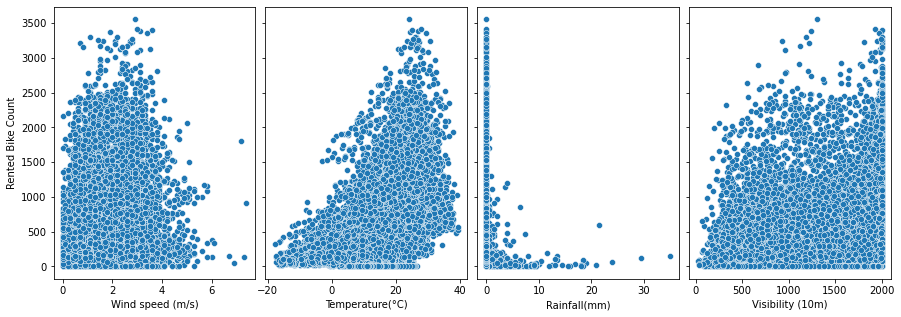

In [12]:
fig, axes = plt.subplots(1, 4, figsize=(15, 5), sharey=True)
plt.subplots_adjust(wspace=0.05)

x_data = {axes[0]:'Wind speed (m/s)', axes[1]:'Temperature(°C)', axes[2]:'Rainfall(mm)', axes[3]:'Visibility (10m)'}

for ax in axes:
    sns.scatterplot(ax=ax, data=df, x=x_data.get(ax), y='Rented Bike Count')

plt.show()

<AxesSubplot:xlabel='Temperature(°C)'>

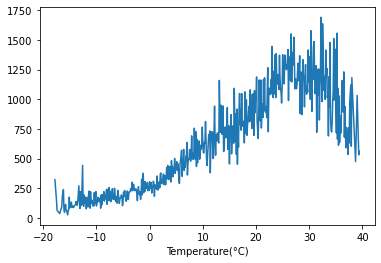

In [13]:
df.groupby('Temperature(°C)')['Rented Bike Count'].mean().plot()

<AxesSubplot:xlabel='Rainfall(mm)'>

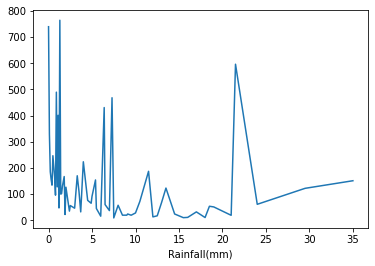

In [14]:
df.groupby('Rainfall(mm)')['Rented Bike Count'].mean().plot()

<AxesSubplot:xlabel='Wind speed (m/s)'>

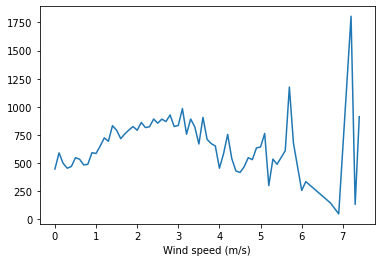

In [15]:
df.groupby('Wind speed (m/s)')['Rented Bike Count'].mean().plot()


Also, some categorical features appear to have remarkable impact on the numbers of bikes rented. For example, there is noticeable difference between the seasons, as well as the period of the day. It is quite possible that peaks at 8:00 am and 6:00 pm are associated with work commuting.

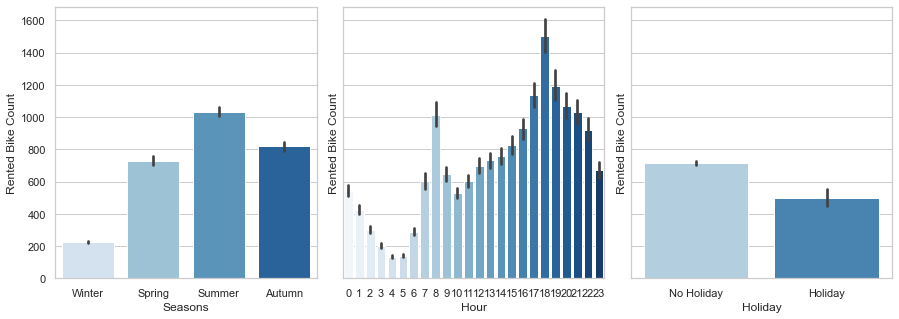

In [16]:
sns.set_style("whitegrid")
sns.set_theme(style="whitegrid")
fig, axes = plt.subplots(1, 3, figsize=(15, 5), sharey=True)
plt.subplots_adjust(wspace=0.10)

x_data = {axes[0]:'Seasons', axes[1]:'Hour', axes[2]:'Holiday'}

for ax in axes:
    sns.barplot(ax=ax, data=df, x=x_data.get(ax), y='Rented Bike Count', palette = "Blues")
    #ax.tick_params(axis='x', rotation=30)
    #ax.xaxis.set_label_text('')
    
#fig.legend(['default: 0', 'default: 1'], loc = 'upper center', ncol=2)

plt.show()

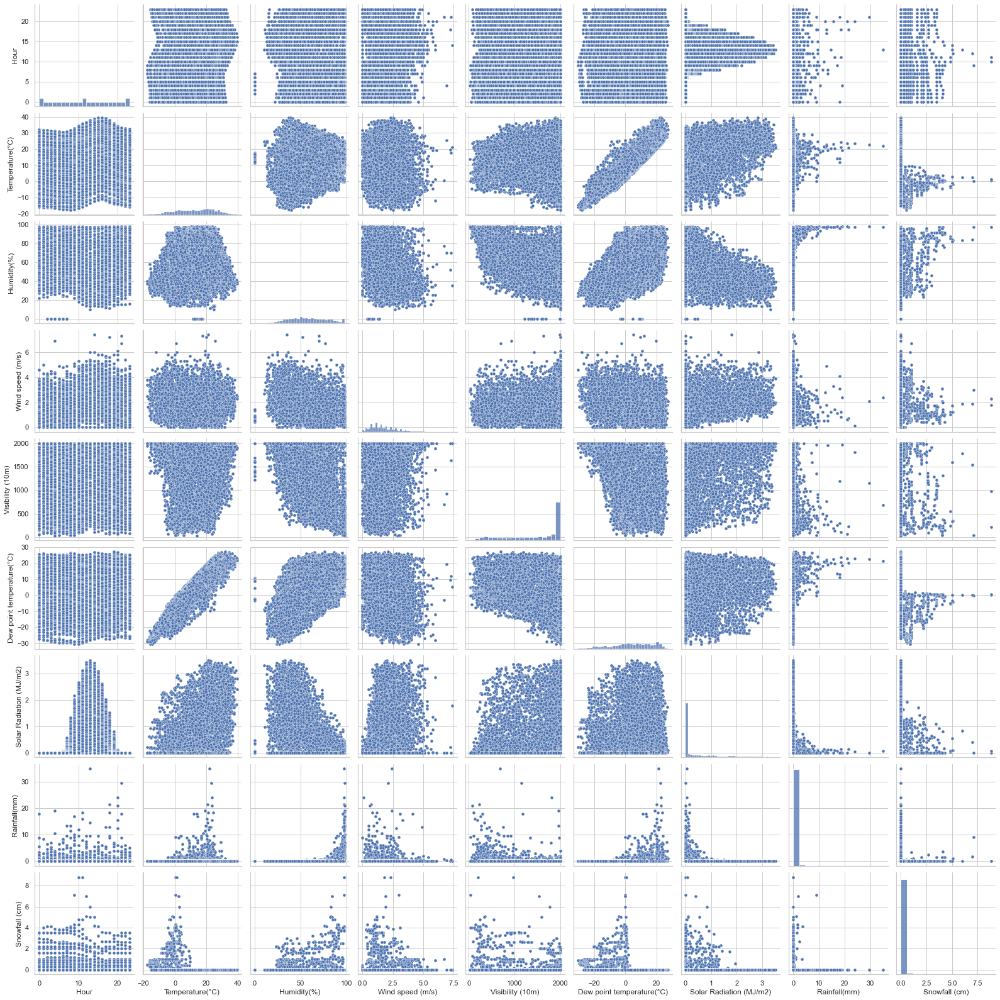

In [17]:
sns.pairplot(df, x_vars=num_columns, y_vars=num_columns, 
             plot_kws={'s': 25}
             )
plt.show()

Per below correlation matrix, some features, such as temperatures and percentage humidity are strongly correlated to some other variables.

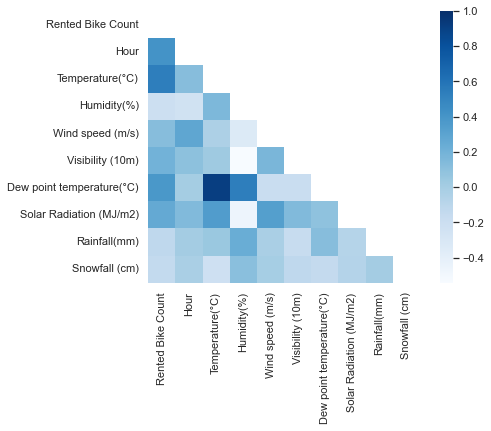

In [18]:
corr_mat = df.corr()
mask = np.zeros_like(corr_mat)
mask[np.triu_indices_from(mask)] = True

fig, ax = plt.subplots(figsize=(7, 5))
ax = sns.heatmap(corr_mat, cmap='Blues', mask=mask, vmax=1, square=True)

# Regression model training

## Project assumptions for predictive modeling

The key assuption of the project was to develop at least three different variant of supervised models based on linear regression. 

As a initial part of the linear regression modeling, the dataset has been split into training and test set with the ratio of 80:20. 

Then, the following models have been developed:
* Baseline model – linear regression model with no additional hyperparameters
* Model A – linear regression model with polynomial features
* Model B – Lasso regression model with default regularization parameter
* Model C – Lasso regression model with polynomial features and regularization hyperparameter tuned
* Model D – Ridge regression model with polynomial features and regularization hyperparameter tuned

Each model has been trained, and evaluated accordingly to 10-fold cross validation, rated using R2 score. For Lasso and Ridge regression models, grid search approach has been used in order for hyperparameters tuning. Results are available as per the following table:


## Train-test split

In [19]:
X, y = df.drop(columns=['Rented Bike Count']), df['Rented Bike Count']

In [20]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, 
                                                    random_state=123)

In [21]:
kf = KFold(n_splits=10, shuffle=True, random_state=123)

## Preprocessing

As the dataset includes a number of categorical values as well as numeric, various feature transformations were required for further predictive modeling. To perform this, variables were split into individual groups then encoding and scaling was applied: One Hot Encoding method for categorical values, and Min Max Scaler has been applied for numeric values

In [22]:
numerical_transformer = StandardScaler()
#numerical_transformer = MinMaxScaler()
categorical_transformer = OneHotEncoder(sparse=False, drop='first')


In [23]:
preprocessor = ColumnTransformer(
    transformers=[
                  ('numerical', numerical_transformer, num_columns),
                  ('categorical',categorical_transformer, cat_columns),
    ])

In [24]:
initial_pipe = Pipeline(steps=[('preprocessor',preprocessor)])

In [25]:
mod_sum_df = pd.DataFrame(columns=['Model Name', 
                                   'Model Type', 
                                   'R2 Score (Training set)',
                                   'R2 Score (Test set)',
                                   '# Non-zero features'])

## Base Linear regression model

In [26]:
lr = LinearRegression()

In [27]:
pipe = clone(initial_pipe)
pipe.steps.append(['regression', lr])

In [28]:
scores = []
cv_predict = cross_val_predict(pipe, X_train, y_train, cv=kf, n_jobs=5)
score = r2_score(y_train, cv_predict)
scores.append(score)

In [29]:
print(f'{lr.__class__.__name__} model R2 score: {score}')

LinearRegression model R2 score: 0.5504916015401631


In [30]:
pipe.fit(X_train, y_train)
y_predicted = pipe.predict(X_test)
print(r2_score(y_test, y_predicted))

0.5424645252349515


In [31]:
mod_sum_df.loc[mod_sum_df.shape[0]] = ['Base model',
                                       str(lr.__class__.__name__),
                                       score,
                                       r2_score(y_test, y_predicted), 
                                       (pipe.named_steps["regression"].coef_!=0).sum()]

In [32]:
y_pred_0 = pd.Series(data=y_predicted, name='Base model')

## Model A: Linear regression with polynomial

In [33]:
pf = PolynomialFeatures(degree=2, include_bias=False,)
pipe = clone(initial_pipe)
pipe.steps.append(['polynomial', pf])
pipe.steps.append(['regression', lr])
pipe

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('numerical', StandardScaler(),
                                                  ['Hour', 'Temperature(°C)',
                                                   'Humidity(%)',
                                                   'Wind speed (m/s)',
                                                   'Visibility (10m)',
                                                   'Dew point temperature(°C)',
                                                   'Solar Radiation (MJ/m2)',
                                                   'Rainfall(mm)',
                                                   'Snowfall (cm)']),
                                                 ('categorical',
                                                  OneHotEncoder(drop='first',
                                                                sparse=False),
                                                  ['Seasons', 'Holiday',
                                                   'Functioning Day'])])),
                ['polynomial', PolynomialFeatures(include_bias=False)],
                ['regression', LinearRegression()]])

In [34]:
scores = []
cv_predict = cross_val_predict(pipe, X_train, y_train, cv=kf, n_jobs=5)
score = r2_score(y_train, cv_predict)
scores.append(score)

In [35]:
print(f'{lr.__class__.__name__} model R2 train score: {score}')

LinearRegression model R2 train score: 0.701620723059216


In [36]:
pipe.fit(X_train, y_train)
y_predicted = pipe.predict(X_test)
print(r2_score(y_test, y_predicted))

0.6896456982748871


In [37]:
mod_sum_df.loc[mod_sum_df.shape[0]] = ['Model A',
                                       str(lr.__class__.__name__),
                                       score,
                                       r2_score(y_test, y_predicted), 
                                       (pipe.named_steps["regression"].coef_!=0).sum()]

In [38]:
y_pred_1 = pd.Series(data=y_predicted, name='Model A')

## Model B LASSO

In [39]:
las = Lasso(alpha=1, max_iter=1000)

In [40]:
pipe = clone(initial_pipe)
#pipe.steps.append(['polynomial', pf])
pipe.steps.append(['regression', las])

In [41]:
scores = []
cv_predict = cross_val_predict(pipe, X_train, y_train, cv=kf, n_jobs=5)
score = r2_score(y_train, cv_predict)
scores.append(score)

In [42]:
print(f'{las.__class__.__name__} model R2 train score: {score}')

Lasso model R2 train score: 0.5500830856755736


In [43]:
pipe.fit(X_train, y_train)
y_predicted = pipe.predict(X_test)
print(r2_score(y_test, y_predicted))

0.54221859015478


In [44]:
abs(pipe.named_steps["regression"].coef_).sum()

2454.4030804898175

In [45]:
(pipe.named_steps["regression"].coef_!=0).sum()

14

In [46]:
pipe.named_steps['preprocessor'].get_feature_names_out()

array(['numerical__Hour', 'numerical__Temperature(°C)',
       'numerical__Humidity(%)', 'numerical__Wind speed (m/s)',
       'numerical__Visibility (10m)',
       'numerical__Dew point temperature(°C)',
       'numerical__Solar Radiation (MJ/m2)', 'numerical__Rainfall(mm)',
       'numerical__Snowfall (cm)', 'categorical__Seasons_Spring',
       'categorical__Seasons_Summer', 'categorical__Seasons_Winter',
       'categorical__Holiday_No Holiday',
       'categorical__Functioning Day_Yes'], dtype=object)

In [47]:
df_legend = pd.DataFrame(zip([('x' + str(x)) for x in range(17)], pipe.named_steps['preprocessor'].get_feature_names_out()))

In [48]:
df_legend.rename(columns = {0:'Variable', 1:'Name'}, inplace = True)
df_legend['Name'] = df_legend['Name'].str.replace('numerical__','')
df_legend['Name'] = df_legend['Name'].str.replace('categorical__','')

In [49]:
mod_sum_df.loc[mod_sum_df.shape[0]] = ['Model B',
                                       str(las.__class__.__name__),
                                       score,
                                       r2_score(y_test, y_predicted), 
                                       (pipe.named_steps["regression"].coef_!=0).sum()]

In [50]:
y_pred_2 = pd.Series(data=y_predicted, name='Model B')

## Model C: LASSO with polynomial features and regularization hyperparameter tuned

In [51]:
las_2 = Lasso(max_iter=10000)
r2_scoring = make_scorer(r2_score)

In [52]:
%%time

pipe = clone(initial_pipe)
pipe.steps.append(['polynomial', pf])
pipe.steps.append(['regression', las_2])

params = {
    'polynomial__degree': [1, 2],
    'regression__alpha': np.geomspace(0.001, 1, num=10)
  #  'regression__alpha': [0.001, 0.01, 0.1, 1]
}

grid = GridSearchCV(pipe, params, scoring=r2_scoring, n_jobs=5, cv=kf, verbose=1)

grid.fit(X_train, y_train)

Fitting 10 folds for each of 20 candidates, totalling 200 fits
Wall time: 3min 58s


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.208e+05, tolerance: 2.947e+05
  model = cd_fast.enet_coordinate_descent(


GridSearchCV(cv=KFold(n_splits=10, random_state=123, shuffle=True),
             estimator=Pipeline(steps=[('preprocessor',
                                        ColumnTransformer(transformers=[('numerical',
                                                                         StandardScaler(),
                                                                         ['Hour',
                                                                          'Temperature(°C)',
                                                                          'Humidity(%)',
                                                                          'Wind '
                                                                          'speed '
                                                                          '(m/s)',
                                                                          'Visibility '
                                                                          '(10m)',
                                                                          'Dew '
                                                                          'point '
                                                                          'temperature(°C)',
                                                                          'Solar '
                                                                          'Radiation '
                                                                          '(MJ/m2)',
                                                                          'Rainfall(mm)',
                                                                          'Snowfall '
                                                                          '(cm)']),
                                                                        ('catego...
                                                                                       sparse=False),
                                                                         ['Seasons',
                                                                          'Holiday',
                                                                          'Functioning '
                                                                          'Day'])])),
                                       ['polynomial',
                                        PolynomialFeatures(include_bias=False)],
                                       ['regression', Lasso(max_iter=10000)]]),
             n_jobs=5,
             param_grid={'polynomial__degree': [1, 2],
                         'regression__alpha': array([0.001     , 0.00215443, 0.00464159, 0.01      , 0.02154435,
       0.04641589, 0.1       , 0.21544347, 0.46415888, 1.        ])},
             scoring=make_scorer(r2_score), verbose=1)

In [53]:
print(f'Best score: {grid.best_score_}')
print(f'Best score: {grid.best_params_}')

Best score: 0.7008218275735205
Best score: {'polynomial__degree': 2, 'regression__alpha': 0.046415888336127774}


In [54]:
y_predicted = grid.predict(X_test)
print(r2_score(y_test, y_predicted))

0.6903257765763224


In [55]:
best_params = grid.best_params_

In [56]:
las_df_importances = pd.DataFrame(zip(grid.best_estimator_.named_steps["polynomial"].get_feature_names_out(),
                 grid.best_estimator_.named_steps["regression"].coef_,
))

In [57]:
#grid.feature_names_in_
#col_names_dict = dict(zip(list(range(len(X.columns.values))), X.columns.values))

In [58]:
#col_names_dict

In [59]:
mod_sum_df.loc[mod_sum_df.shape[0]] = ['Model C',
                                       str(las_2.__class__.__name__),
                                       grid.best_score_,
                                       r2_score(y_test, y_predicted), 
                                       (grid.best_estimator_.named_steps["regression"].coef_!=0).sum()]

In [60]:
y_pred_3 = pd.Series(data=y_predicted, name='Model C')

In [61]:
las_df_importances.rename(columns = {0:'Variable', 1:'Coefficient'}, inplace = True)
las_df_importances = las_df_importances.sort_values(by='Coefficient')

## Model D: Ridge regression with polynomial features and regularization hyperparameter tuned

In [62]:
ridge = Ridge(max_iter=10000)
r2_scoring = make_scorer(r2_score)

In [63]:
pipe = clone(initial_pipe)
pipe.steps.append(['polynomial', pf])
pipe.steps.append(['regression', ridge])

params = {
    'polynomial__degree': [1, 2],
    'regression__alpha': np.geomspace(1, 30, 50)
    #'regression__alpha': [1e-15, 1e-10, 1e-8, 1e-4, 1e-3,1e-2, 1, 5, 10, 20]
}

In [64]:
%%time
grid = GridSearchCV(pipe, params, scoring=r2_scoring, n_jobs=5, cv=kf, verbose=1)
grid.fit(X_train, y_train)

Fitting 10 folds for each of 100 candidates, totalling 1000 fits
Wall time: 8.04 s


GridSearchCV(cv=KFold(n_splits=10, random_state=123, shuffle=True),
             estimator=Pipeline(steps=[('preprocessor',
                                        ColumnTransformer(transformers=[('numerical',
                                                                         StandardScaler(),
                                                                         ['Hour',
                                                                          'Temperature(°C)',
                                                                          'Humidity(%)',
                                                                          'Wind '
                                                                          'speed '
                                                                          '(m/s)',
                                                                          'Visibility '
                                                                          '(10m)',
                                                                          'Dew '
                                                                          'point '
                                                                          'temperature(°C)',
                                                                          'Solar '
                                                                          'Radiation '
                                                                          '(MJ/m2)',
                                                                          'Rainfall(mm)',
                                                                          'Snowfall '
                                                                          '(cm)']),
                                                                        ('catego...
        4.00780548,  4.29587827,  4.60465714,  4.93563039,  5.29039332,
        5.67065588,  6.07825093,  6.51514306,  6.98343811,  7.48539323,
        8.02342785,  8.6001353 ,  9.21829528,  9.88088733, 10.59110513,
       11.35237191, 12.16835699, 13.04299338, 13.98049684, 14.98538611,
       16.06250475, 17.21704446, 18.45457009, 19.78104652, 21.20286734,
       22.7268857 , 24.36044736, 26.11142606, 27.9882615 , 30.        ])},
             scoring=make_scorer(r2_score), verbose=1)

In [65]:
print(f'Best score: {grid.best_score_}')
print(f'Best score: {grid.best_params_}')

Best score: 0.7000458399789703
Best score: {'polynomial__degree': 2, 'regression__alpha': 1.0}


In [66]:
y_predicted = grid.predict(X_test)
print(r2_score(y_test, y_predicted))

0.6898163859153111


In [67]:
best_params = grid.best_params_

In [68]:
df_importances = pd.DataFrame(zip(grid.best_estimator_.named_steps["polynomial"].get_feature_names_out(),
                 grid.best_estimator_.named_steps["regression"].coef_,
))

In [69]:
df_importances.sort_values(by=1)

,0,1
37,x1 x10,-1009.686576
7,x7,-534.689250
52,x2 x13,-414.706304
80,x5 x11,-367.168067
75,x5 x6,-241.855013
...,...,...
82,x5 x13,297.283621
36,x1 x9,324.618544
13,x13,336.916765
118,x13^2,336.916765


In [70]:
mod_sum_df.loc[mod_sum_df.shape[0]] = ['Model D',
                                       str(ridge.__class__.__name__),
                                       grid.best_score_,
                                       r2_score(y_test, y_predicted), 
                                       (grid.best_estimator_.named_steps["regression"].coef_!=0).sum()]

In [71]:
len(grid.best_estimator_.named_steps["regression"].coef_)

119

In [72]:
y_pred_4 = pd.Series(data=y_predicted, name='Model D')

## Results

In [73]:
mod_sum_df.style.hide_index()

Model Name,Model Type,R2 Score (Training set),R2 Score (Test set),# Non-zero features
Base model,LinearRegression,0.550492,0.542465,14
Model A,LinearRegression,0.701621,0.689646,117
Model B,Lasso,0.550083,0.542219,14
Model C,Lasso,0.700822,0.690326,101
Model D,Ridge,0.700046,0.689816,116


In [74]:
results_df = pd.DataFrame(zip(y_pred_0, y_pred_1 ,y_pred_2, 
                 y_pred_3, y_pred_4, y_test), 
             columns=[y_pred_0.name, y_pred_1.name, y_pred_2.name, 
                      y_pred_3.name, y_pred_4.name, 'y_test']
            )

Below scatterplots show individual models’ predictions of rented bikes of against the actual number, taken from the test set:

In [75]:
results_df.plot.scatter(
   # kind='scatter',
    x= ['Base model','Model A','Model B','Model C','Model D'],
    y='y_test', 
    backend='plotly', width=750)

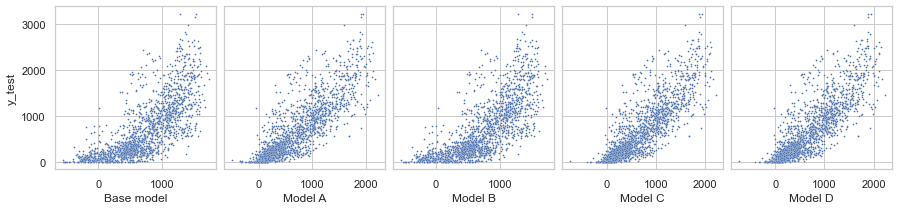

In [76]:
fig, axes = plt.subplots(1, 5, figsize=(15, 3), sharey=True)
#fig, axes = plt.plot(figsize=(15, 5), sharey=True)
plt.subplots_adjust(wspace=0.05)

x_data = {axes[0]:'Base model', axes[1]:'Model A', axes[2]:'Model B', axes[3]:'Model C', axes[4]:'Model D'}

for ax in axes:
    sns.scatterplot(ax=ax, data=results_df, x=x_data.get(ax), y='y_test', s=3)

plt.show()

# Final model

The final linear regression model suggested for application is Model C, based on Lasso regression algorithm, with additionally created polynomial features, and L1 regularization hyperparameter tuned during grid search cross validation process.

The main goal for the predictive modeling was to identify the best performing model and although it has very similar performance to model D (Ridge regression) and Model A (Linear regression with polynomial degree of 2) it has noticeable less non-zero coefficients, therefore it is more straightforward, but also should perform better on new data.


1)	Regression models tend to perform better, when polynomial features were introduced

2)	Based on that, the best performing model’s hyperparameters were:

    Max polynomial degree of 2.
    L1 regularization alpha parameter of 0.05

3)	Due to application of polynomial features, the model complexity increased meaningfully, however by looking just at the single coefficients, it can be observed that the coefficients which impact the bike rental the most are definitely the temperature, seasons, rainfall, the fact of functioning day. Ten most important coefficients, along with the legend are presented below:


# Key Findings and Insights

In [77]:
las_df_importances

,Variable,Coefficient
37,x1 x10,-1287.916675
7,x7,-527.472635
52,x2 x13,-424.794626
80,x5 x11,-408.131311
49,x2 x10,-290.738004
...,...,...
109,x10^2,261.533114
10,x10,324.110437
82,x5 x13,330.600687
13,x13,699.479718


In [78]:
df_legend.style.hide_index()

Variable,Name
x0,Hour
x1,Temperature(°C)
x2,Humidity(%)
x3,Wind speed (m/s)
x4,Visibility (10m)
x5,Dew point temperature(°C)
x6,Solar Radiation (MJ/m2)
x7,Rainfall(mm)
x8,Snowfall (cm)
x9,Seasons_Spring


# Suggestions for next steps

The recommended model seem to be very consistent in terms of accuracy between training and test dataset, measured with R2 score. However, there might be some area of improvement when it comes to performance of the model, which could be achieved by increasing the search space of hyperparameters to tune. Additionally it is suggested to consider further reduction of non-zero coefficients, in order to increase model’s explainability. This might be possible by using a different type of regression model such as Elastic Net. Also, introducing time series analysis methods could be beneficial for prediction purposes.
 
